In [102]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import spearmanr, f_oneway
from scipy.spatial.distance import pdist, squareform
import itertools
from itertools import combinations, permutations

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
plt.rcParams['text.usetex'] = True
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['Computer Modern Roman']  # This is the default LaTeX font
plt.rcParams.update({'font.size': 16, 'axes.labelsize': 16, 'axes.titlesize': 16, 'legend.fontsize': 14})
# Reading the data
df = pd.read_csv('current_analysis/xdbc_experiments_master_v1.csv')
df.drop(columns=['client_readmode', 'table', 'host', 'date', 'run'], inplace=True)
df = df[(df['time']>3) & (df['time']<4000) & (df['datasize']>1000000)]

In [78]:
this_df = df.copy()
this_df['env_id'] = this_df['server_cpu'].astype(str) + '-' + this_df['client_cpu'].astype(str) + '-' + this_df['network'].astype(str)

parameter_cols = ['compression', 'format', 'network_parallelism', 'bufpool_size', 'buff_size', 
                  'client_read_par', 'client_decomp_par', 'server_read_par', 'server_read_partitions', 'server_deser_par']

grouped = this_df.groupby(parameter_cols)['env_id'].nunique().reset_index()

configs_run_in_27_envs = grouped[grouped['env_id'] == 27]

display(configs_run_in_27_envs.count())
display(configs_run_in_27_envs)


compression               2956
format                    2956
network_parallelism       2956
bufpool_size              2956
buff_size                 2956
client_read_par           2956
client_decomp_par         2956
server_read_par           2956
server_read_partitions    2956
server_deser_par          2956
env_id                    2956
dtype: int64

,compression,format,network_parallelism,bufpool_size,buff_size,client_read_par,client_decomp_par,server_read_par,server_read_partitions,server_deser_par,env_id
1,cols,1,1,1000,1000,1,1,1,1,2,27
2,cols,1,1,1000,1000,1,1,1,1,4,27
5,cols,1,1,1000,1000,1,1,1,2,4,27
6,cols,1,1,1000,1000,1,1,1,4,2,27
16,cols,1,1,1000,1000,1,1,2,2,4,27
26,cols,1,1,1000,1000,1,1,4,1,4,27
32,cols,1,1,1000,1000,1,1,4,4,4,27
41,cols,1,1,1000,1000,1,2,1,1,2,27
44,cols,1,1,1000,1000,1,2,1,2,2,27
53,cols,1,1,1000,1000,1,2,2,1,2,27


In [79]:
env_cols = ['server_cpu','client_cpu','network']
# Create a copy of the dataframe
df_copy = df.copy()
df_copy = df_copy[(df_copy['compression'] != 'zlib') & (df_copy['compression'] != 'cols')]

# Convert parameter configurations and environments to string representations
df_copy['param_config'] = df_copy[parameter_cols].astype(str).agg('-'.join, axis=1)
df_copy['environment'] = df_copy[env_cols].astype(str).agg('-'.join, axis=1)

# Filter configurations with entries for all 27 environments
complete_configs = df_copy.groupby('param_config').filter(lambda x: x['environment'].nunique() == 27)['param_config'].unique()

# Restrict to these configurations
filtered_df = df_copy[df_copy['param_config'].isin(complete_configs)]

# Pivot table for easier calculations
pivot_df = filtered_df.pivot_table(index='param_config', columns='environment', values='time', aggfunc='mean')

# Compute the differences
differences = pivot_df.values[:, None, :] - pivot_df.values[None, :, :]

# Determine where one configuration is faster than the other
trading_places = differences > 0

# Count how many times each configuration pair trades places
ranking = trading_places.sum(axis=2)

# Compute the total absolute differences for each pair
total_abs_diff = np.abs(differences).sum(axis=2)

# Normalize the trading places count and total absolute difference
norm_ranking = ranking / ranking.max()
norm_total_abs_diff = total_abs_diff / total_abs_diff.max()

# Combine the two normalized scores
combined_score = norm_ranking + norm_total_abs_diff

# Mask diagonal and lower triangle to avoid duplicates and self-comparison
mask = np.triu(np.ones_like(combined_score), k=1)
combined_score_masked = np.where(mask, combined_score, 0)

# Extract the indices of the top pair
i, j = np.unravel_index(combined_score_masked.argmax(axis=None), combined_score.shape)


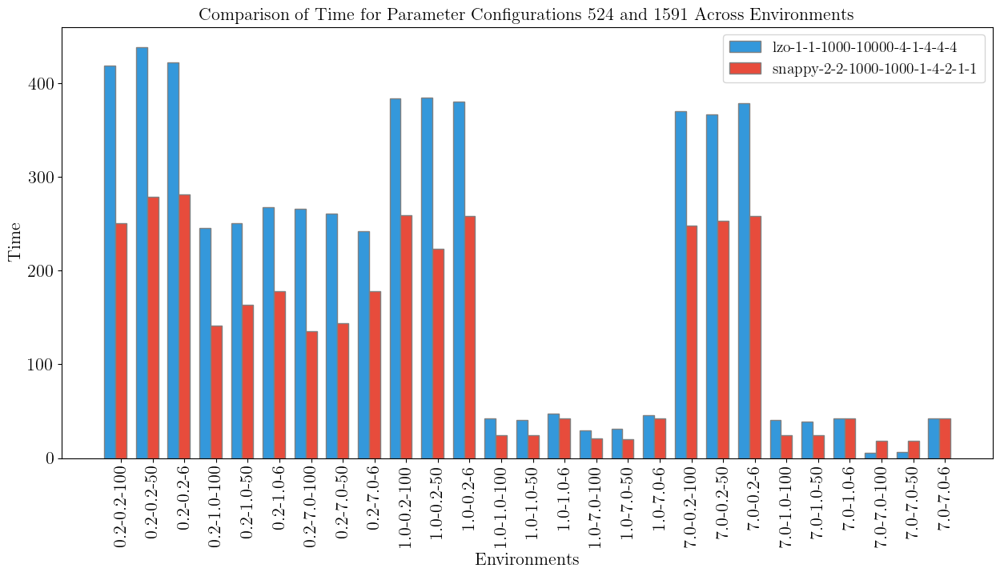

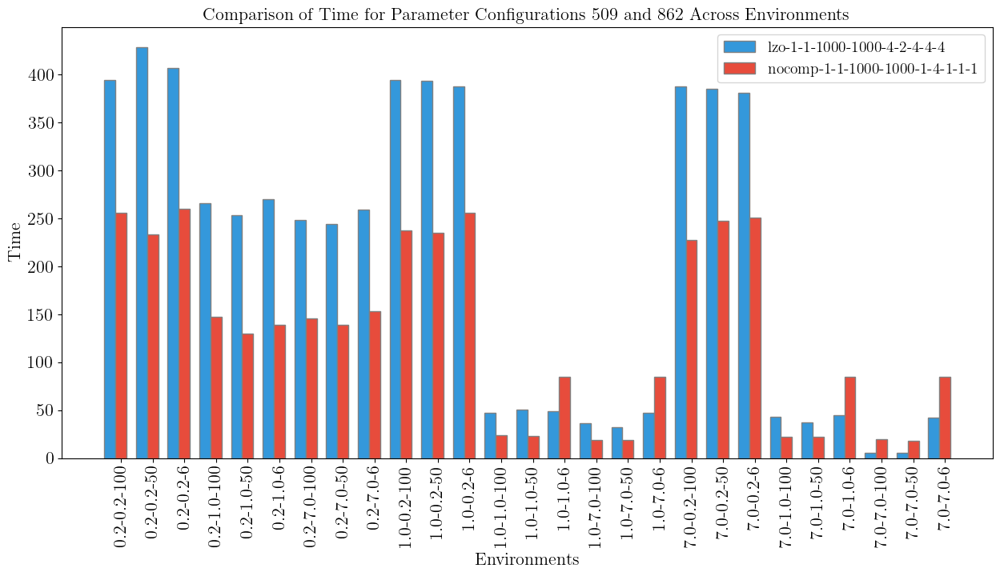

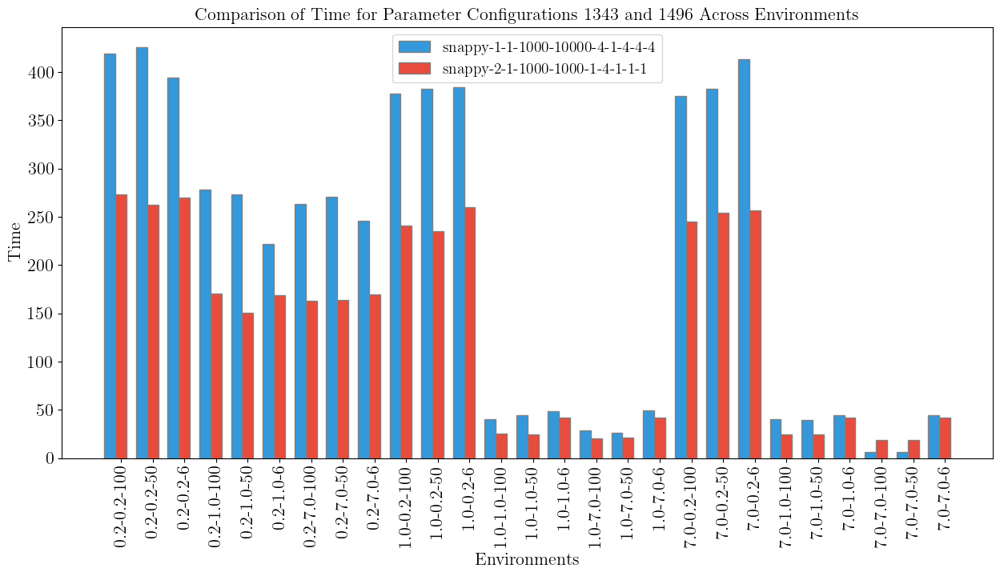

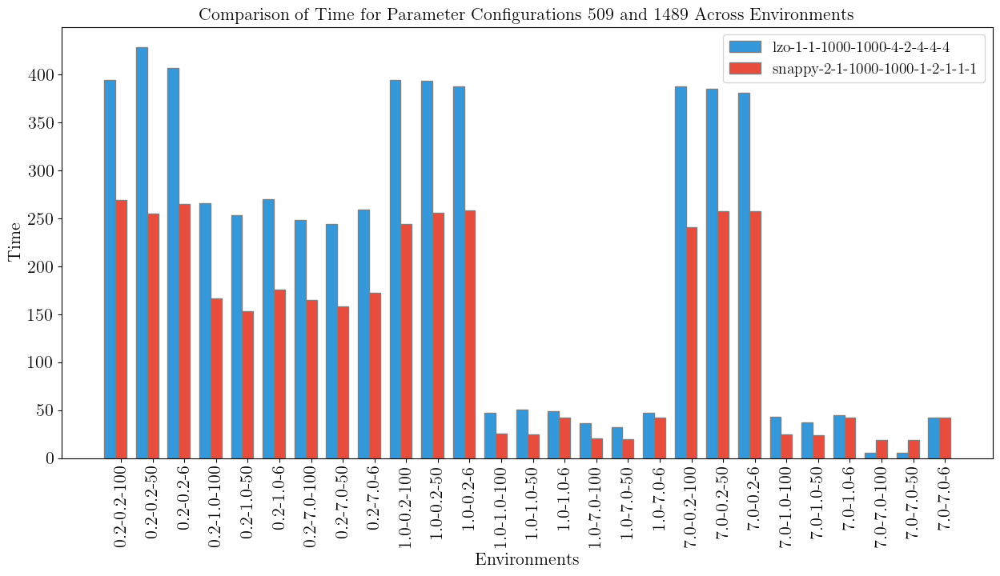

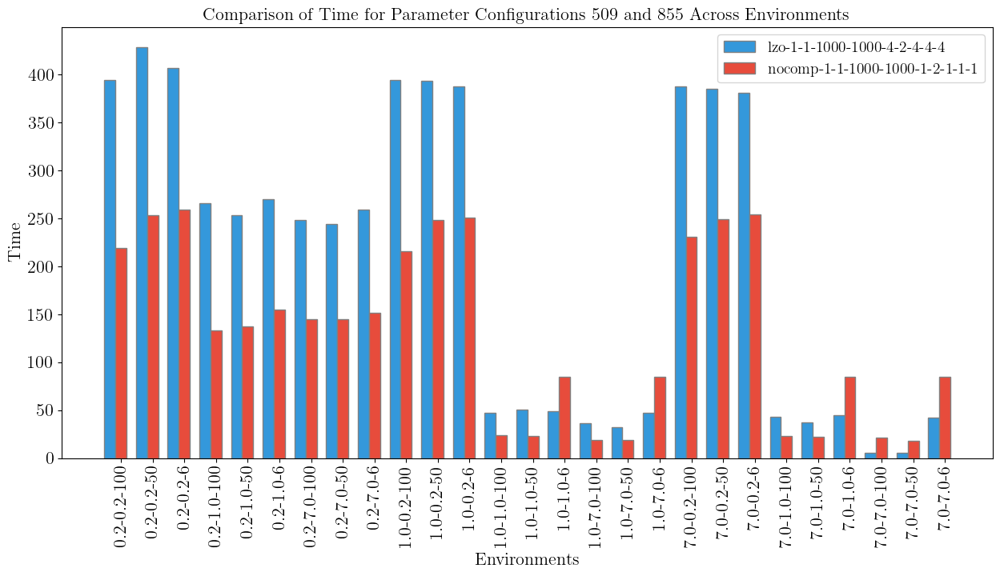

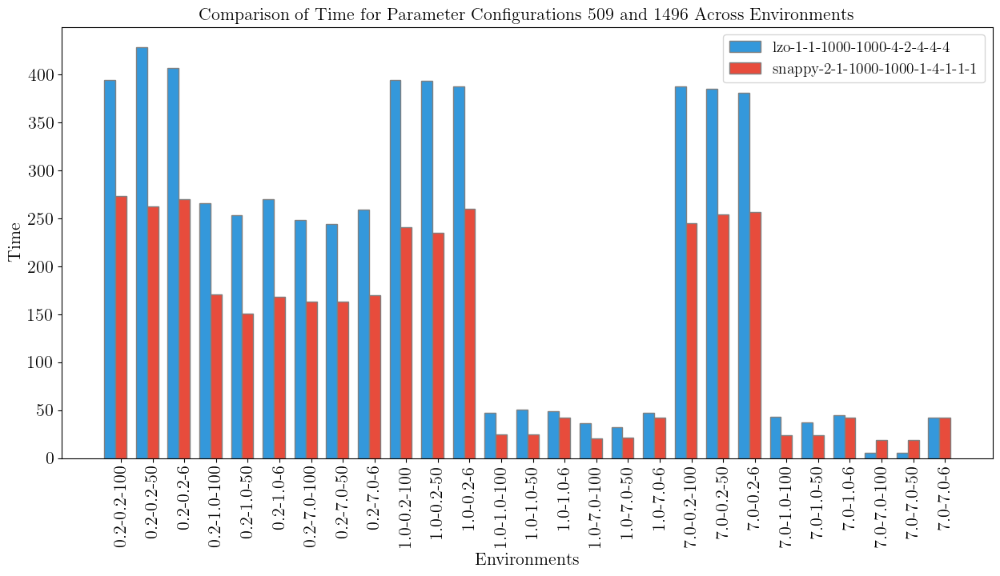

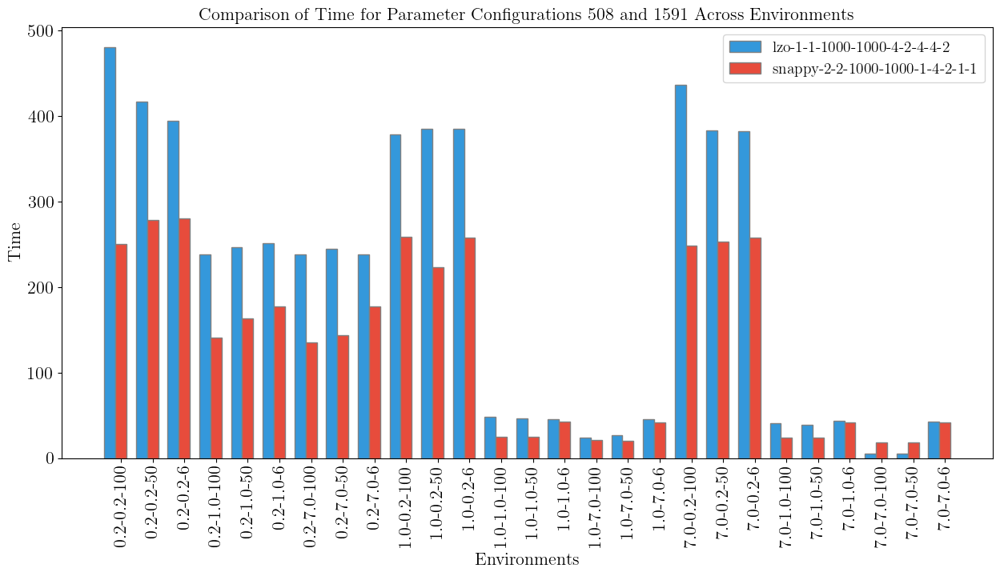

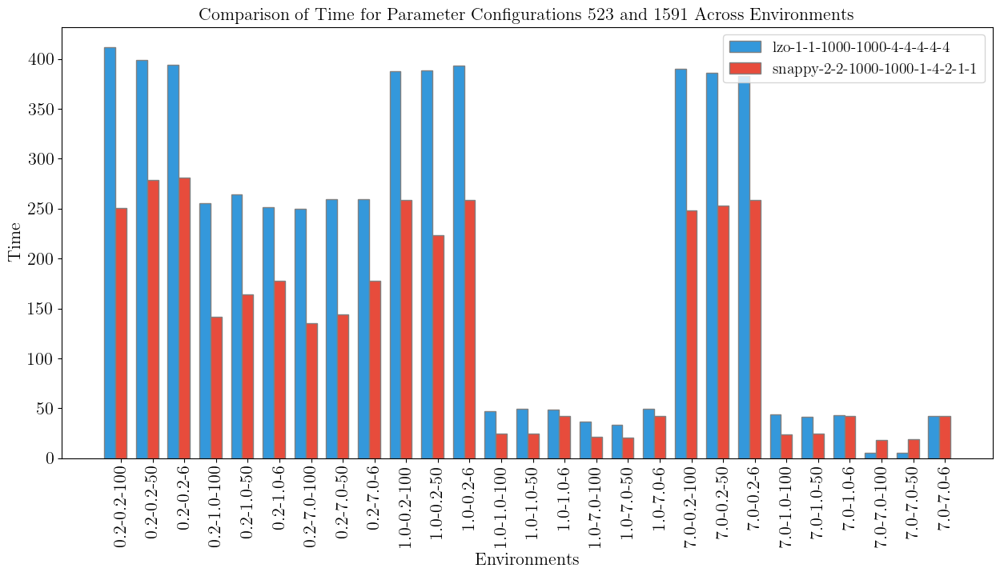

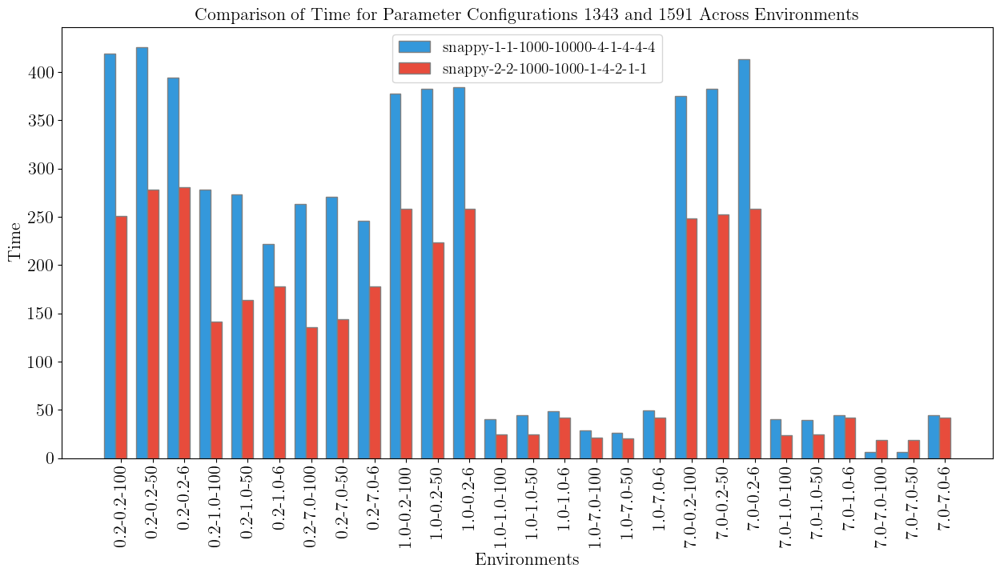

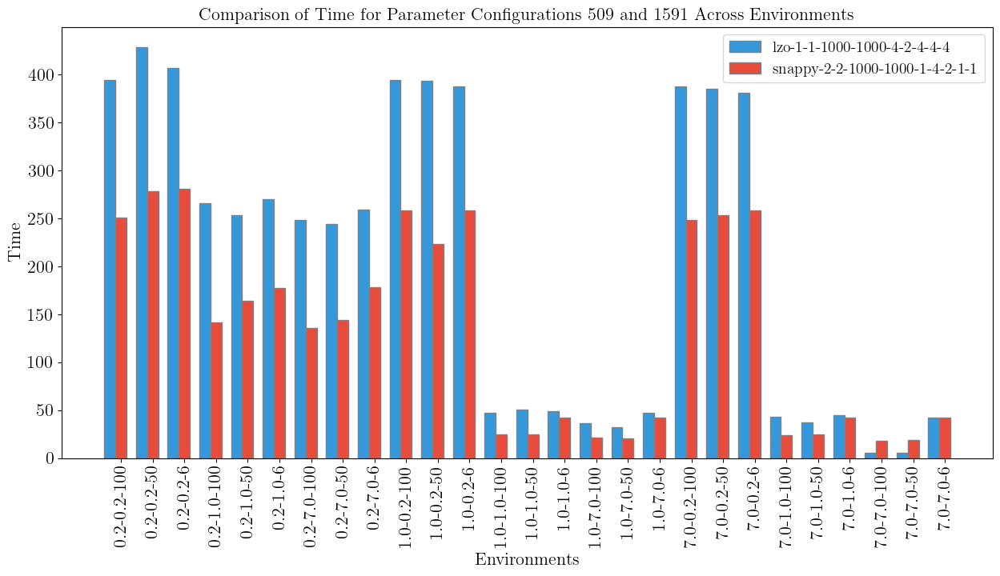

In [80]:
# Choose two distinct colors
color1 = '#3498db'  # A shade of blue
color2 = '#e74c3c'  # A shade of red

# Number of top pairs to visualize
N = 10

# Get the indices of the top N pairs
top_indices = np.dstack(np.unravel_index(np.argsort(combined_score_masked.ravel())[-N:], combined_score.shape))[0]

# Iterate over the top pairs and plot them
for idx in top_indices:
    i, j = idx
    config1 = pivot_df.index[i]
    config2 = pivot_df.index[j]

    # Plotting
    data1 = pivot_df.loc[config1].values
    data2 = pivot_df.loc[config2].values
    barWidth = 0.35
    r1 = range(len(data1))
    r2 = [x + barWidth for x in r1]

    plt.figure(figsize=(15, 7))
    plt.bar(r1, data1, width=barWidth, color=color1, edgecolor='grey', label=str(config1))
    plt.bar(r2, data2, width=barWidth, color=color2, edgecolor='grey', label=str(config2))
    plt.title(f'Comparison of Time for Parameter Configurations {i+1} and {j+1} Across Environments')
    plt.xlabel('Environments', fontweight='bold')
    plt.ylabel('Time', fontweight='bold')
    plt.xticks([r + barWidth for r in range(len(data1))], pivot_df.columns, rotation=90)
    plt.legend()
    plt.show()


In [104]:
parameter_cols = ['compression', 'format', 'network_parallelism', 'bufpool_size', 'buff_size', 
                  'client_read_par', 'client_decomp_par', 'server_read_par', 'server_read_partitions', 'server_deser_par']
env_cols = ['server_cpu','client_cpu','network']
res_cols = ['time']
# The existing code you provided is used here to prepare the pivot_df
df_copy = df.copy()
df_copy = df_copy[(df_copy['compression'] != 'zlib') & (df_copy['compression'] != 'cols')]
df_copy['param_config'] = df_copy[parameter_cols].astype(str).agg('-'.join, axis=1)
df_copy['environment'] = df_copy[env_cols].astype(str).agg('-'.join, axis=1)

param_combinations = df_copy[parameter_cols].drop_duplicates()
param_combinations['param_id'] = range(1, len(param_combinations) + 1)

# Create a unique identifier for each environment
environments = df_copy[env_cols].drop_duplicates()
environments['env_id'] = range(1, len(environments) + 1)

# Now, merge these back into your original dataframe to get 'param_id' and 'env_id' for each row
df_with_ids = df_copy.merge(param_combinations, on=parameter_cols, how='left')
df_with_ids = df_with_ids.merge(environments, on=env_cols, how='left')

# Now, filter out parameter configurations that do not have values for all 27 environments
env_counts = df_with_ids.groupby('param_id')['env_id'].nunique()
valid_param_ids = env_counts[env_counts == 27].index
df_valid_params = df_with_ids[df_with_ids['param_id'].isin(valid_param_ids)].copy()

# Check for duplicates based on 'param_id' and 'env_id'
duplicates = df_valid_params.duplicated(subset=['param_id', 'env_id'], keep=False)
if duplicates.any():
    df_valid_params = (
        df_valid_params.groupby(['param_id', 'env_id'], as_index=False)
        .agg({'time': 'mean', **{col: 'first' for col in df_valid_params.columns if col not in ['param_id', 'env_id', 'time']}})
    )

# Now, assign ranks consecutively within each 'param_id' group
df_valid_params['consecutive_rank'] = df_valid_params.groupby('param_id')['time'].rank(method='first', ascending=True)

# Only retain the columns of interest for the 'rankings_df'.
rankings_df = df_valid_params[['param_id', 'env_id', 'consecutive_rank']]

# Sort the DataFrame based on 'param_id' and 'consecutive_rank'.
rankings_df = rankings_df.sort_values(by=['param_id', 'consecutive_rank'])

# Reset the index of the DataFrame.
rankings_df.reset_index(drop=True, inplace=True)

# Display the result
display(rankings_df)

,param_id,env_id,consecutive_rank
0,2,7,1.0
1,2,20,2.0
2,2,1,3.0
3,2,19,4.0
4,2,21,5.0
5,2,22,6.0
6,2,23,7.0
7,2,3,8.0
8,2,9,9.0
9,2,15,10.0


In [122]:
pivot_ranks = rankings_df.pivot(index='env_id', columns='param_id', values='consecutive_rank')
from operator import itemgetter
# Initialize an empty list to store the differences and the pairs
rank_differences = []

# Calculate rank differences between all pairs for each environment
for env, row in pivot_ranks.iterrows():
    for (param1, rank1), (param2, rank2) in itertools.combinations(row.iteritems(), 2):
        rank_diff = abs(rank1 - rank2)
        rank_differences.append((rank_diff, param1, param2, env))

# Sort the list of tuples by the rank difference in descending order
rank_differences.sort(key=itemgetter(0), reverse=True)

# Now you can iterate over this sorted list and pick pairs that can form valid triplets
valid_triplets = []
seen_pairs = set()

for diff, param1, param2, env in rank_differences:
    # Avoid reusing pairs in the same triplet
    if (param1, param2) in seen_pairs or (param2, param1) in seen_pairs:
        continue
    
    # Check for a third parameter that forms a valid triplet with the pair
    for param3 in pivot_ranks.columns:
        if param3 == param1 or param3 == param2:
            continue
        # Criteria for a valid triplet: param3 should have a different rank compared to param1/param2
        param3_rank = pivot_ranks.at[env, param3]
        if param3_rank != pivot_ranks.at[env, param1] and param3_rank != pivot_ranks.at[env, param2]:
            valid_triplets.append((param1, param2, param3))
            seen_pairs.add((param1, param2))
            break
    
    # Limit the number of triplets if necessary
    if len(valid_triplets) >= 20:  # For example, if you want at most 5 triplets
        break

# Convert the list of triplets into a DataFrame
triplets_df = pd.DataFrame(valid_triplets, columns=['param_id1', 'param_id2', 'param_id3'])

# Display the DataFrame
print(triplets_df)

/tmp/ipykernel_1667423/3631334575.py:8: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for (param1, rank1), (param2, rank2) in itertools.combinations(row.iteritems(), 2):


    param_id1  param_id2  param_id3
0           2      27680          6
1           2      31324          6
2          18      27680          6
3          18      31324          6
4          65      27680          6
5          65      31324          6
6          69      27680          6
7          69      31324          6
8          92      27680          6
9          92      31324          6
10         94      27680          6
11         94      31324          6
12        136      27680          6
13        136      31324          6
14        149      27680          6
15        149      31324          6
16        161      27680          6
17        161      31324          6
18        259      27680          6
19        259      31324          6


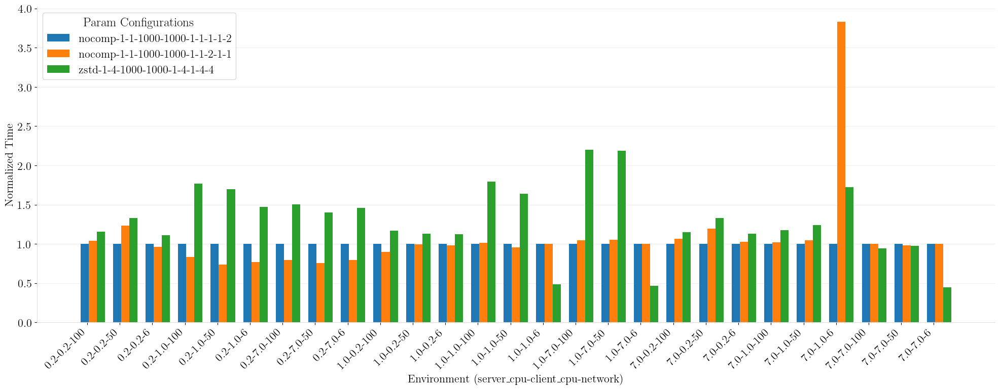

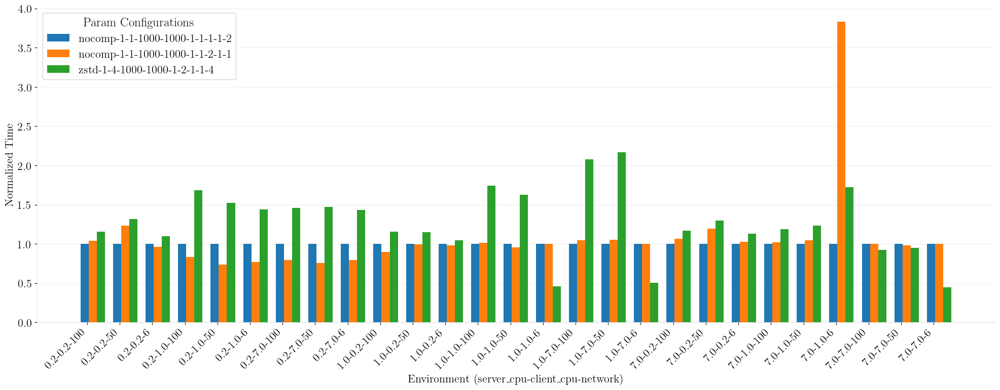

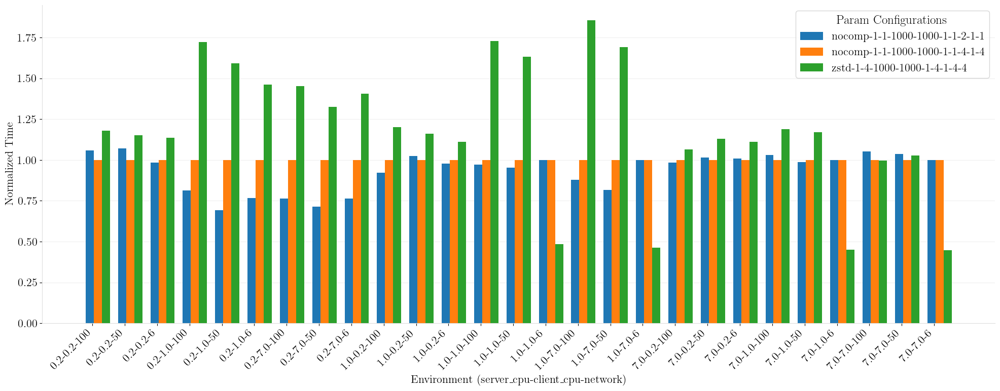

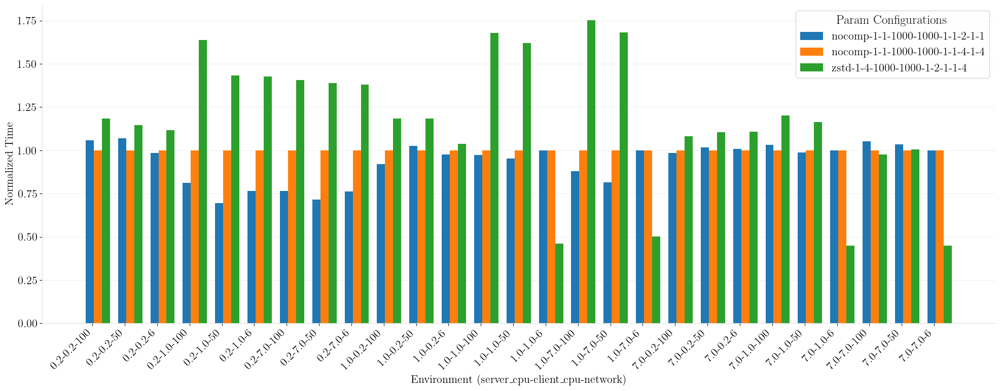

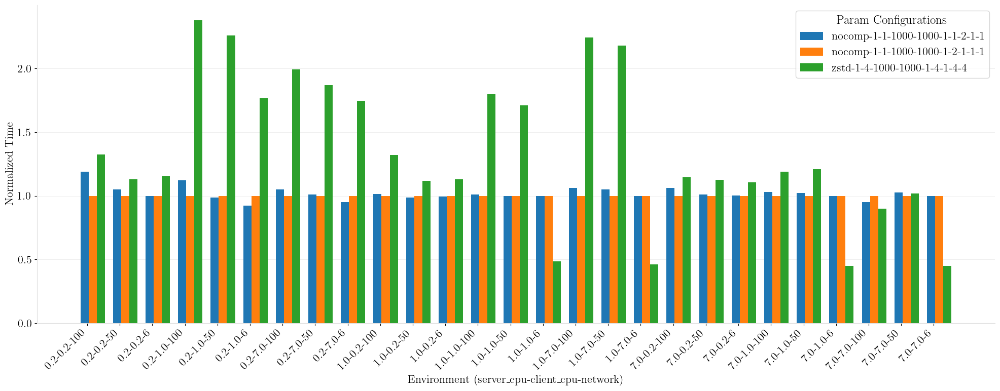

...

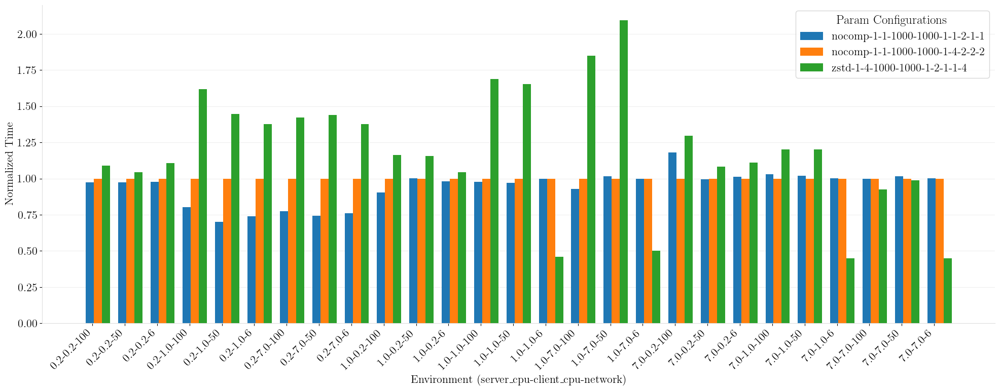

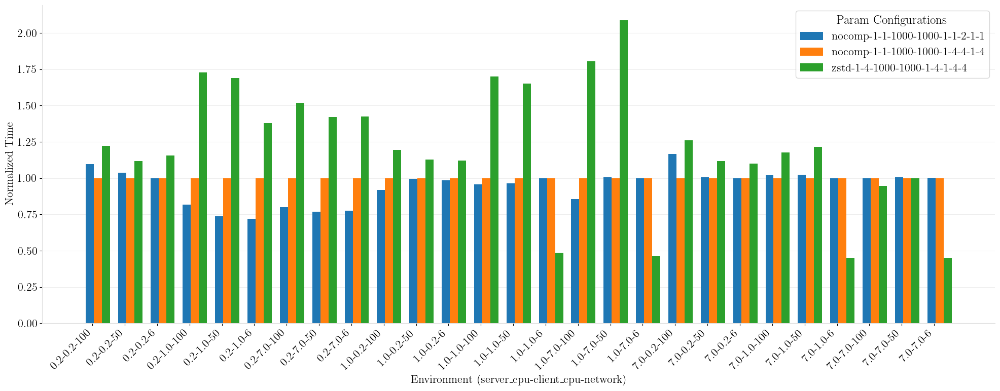

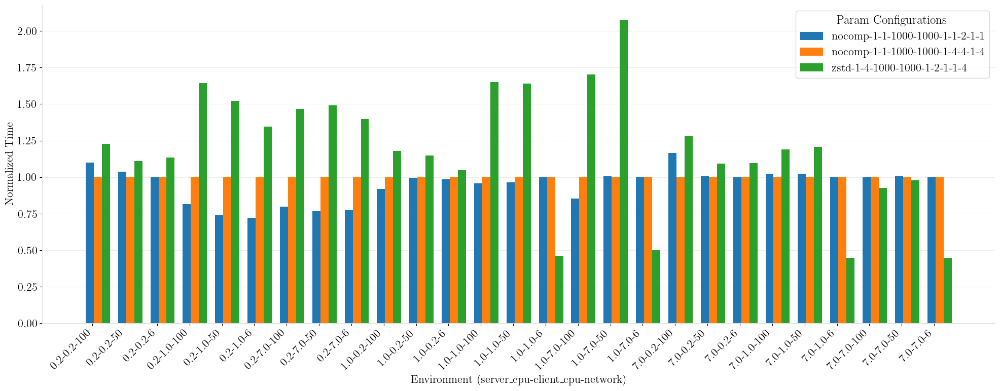

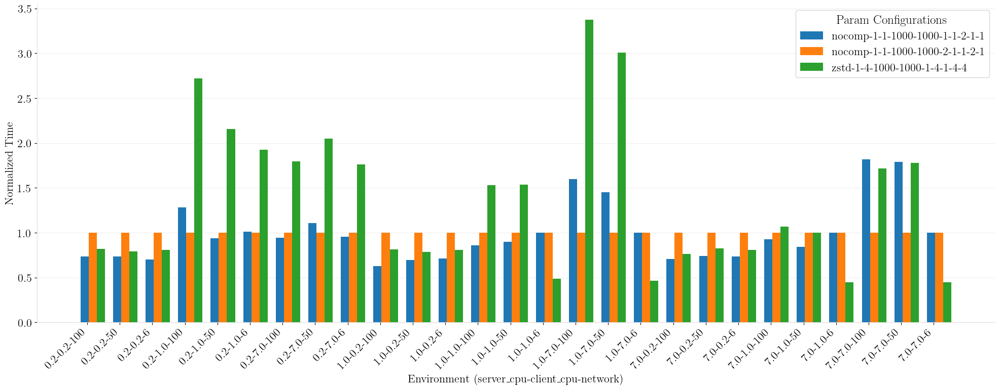

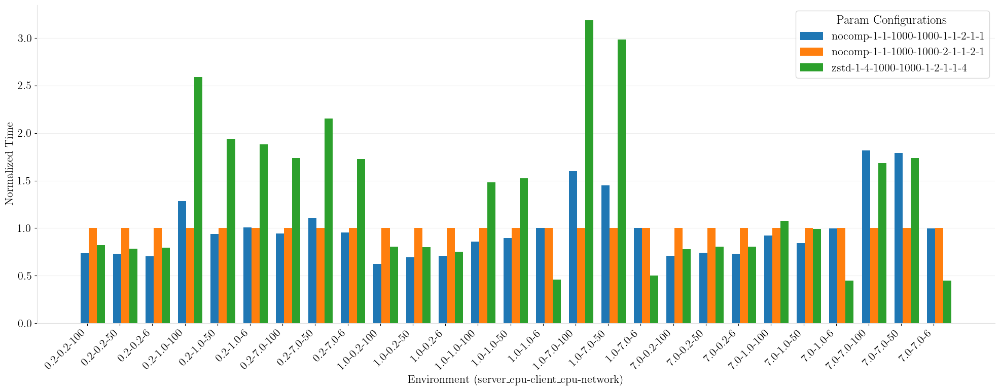

In [123]:
param_id_to_config = dict(zip(param_combinations['param_id'], param_combinations[parameter_cols].astype(str).agg('-'.join, axis=1)))
env_id_to_environment = dict(zip(environments['env_id'], environments[env_cols].astype(str).agg('-'.join, axis=1)))
triplets_to_plot = triplets_df.head(20).values
j=0
for triplet in triplets_to_plot:
    # Filter the DataFrame for the current triplet
    triplet_df = df_with_ids[df_with_ids['param_id'].isin(triplet)]
    
    # Aggregate times by taking the mean for each param_id and env_id combination
    aggregated_times = (
        triplet_df.groupby(['param_id', 'env_id'])
        .agg({'time': 'mean'})
        .reset_index()
    )
    
    # Normalize the times
    baseline_times = aggregated_times[aggregated_times['param_id'] == triplet[0]][['env_id', 'time']]
    df_normalized = aggregated_times.merge(baseline_times, on='env_id', suffixes=('', '_baseline'))
    df_normalized['normalized_time'] = df_normalized['time'] / df_normalized['time_baseline']

    # Mapping the ids to the actual parameter configurations and environment strings
    df_normalized['param_config'] = df_normalized['param_id'].map(param_id_to_config)
    df_normalized['env_string'] = df_normalized['env_id'].map(env_id_to_environment)

    # Pivot the data for plotting
    pivot_df = df_normalized.pivot_table(index='env_string', columns='param_config', values='normalized_time')

   
    bar_width = 0.25  # Adjust as necessary
    n_groups = len(pivot_df.index)
    n_bars = len(pivot_df.columns)
    
    # The x locations for the groups
    ind = np.arange(n_groups)
    
    # Create a figure and a set of subplots
    fig, ax = plt.subplots(figsize=(20, 8))
    
    # Plot each set of bars
    for i in range(n_bars):
        ax.bar(ind + i * bar_width, pivot_df.iloc[:, i], bar_width, label=f'{pivot_df.columns[i]}')
    
    # Add some text for labels, title, and customizing the axes ticks
    ax.set_xlabel('Environment (server_cpu-client_cpu-network)', fontsize=16)
    ax.set_ylabel('Normalized Time', fontsize=16)
    #ax.set_title('Performance Comparison by Environment and Parameter Configuration', fontsize=16)
    ax.set_xticks(ind + bar_width / n_bars)
    ax.set_xticklabels((pivot_df.index), rotation=45, ha='right', fontsize=16)
    
    # Add a legend
    ax.legend(title='Param Configurations', fontsize=16, title_fontsize=18)
    
    # Add gridlines below the bars
    ax.set_axisbelow(True)
    ax.yaxis.grid(True, color='#EEEEEE')
    ax.xaxis.grid(False)
    
    # Tweak the style of the axes spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_color('#DDDDDD')
    ax.spines['left'].set_color('#DDDDDD')
    
    # Show the plot
    plt.tight_layout()  # This ensures that all labels and titles are visible
    plt.show()
    #j+=1
    #print(j)
    #if j==3:
    #    plt.savefig(f'paper_plots/environment_{i}.pdf', bbox_inches='tight')


system                    27
compression               27
format                    27
network_parallelism       27
bufpool_size              27
buff_size                 27
network                   27
client_cpu                27
client_read_par           27
client_decomp_par         27
server_cpu                27
server_read_par           27
server_read_partitions    27
server_deser_par          27
time                      27
datasize                  27
environment               27
env_strength              27
dtype: int64


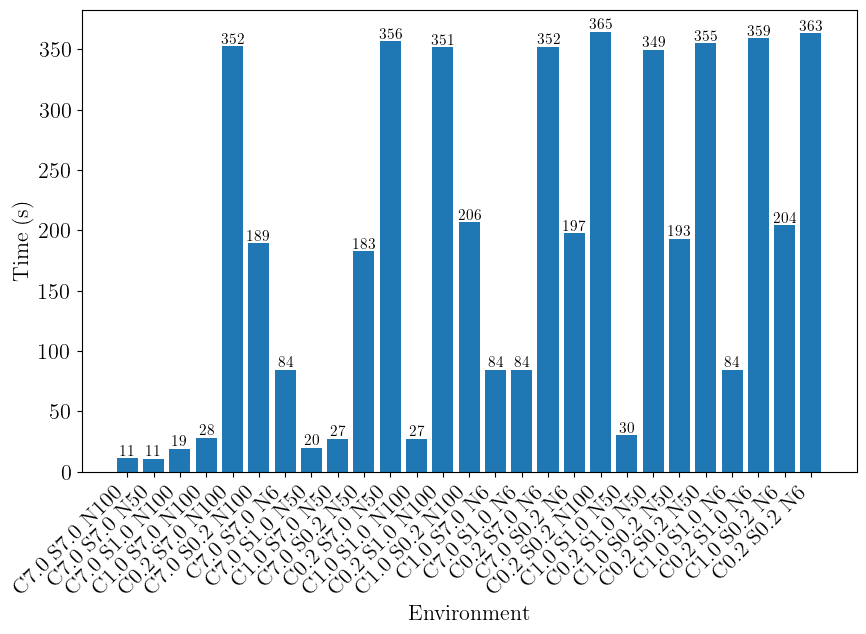

In [9]:
def normalize(value, min_value, max_value):
    return (value - min_value) / (max_value - min_value)



filtered_df = df.copy()
filtered_df = filtered_df[
    (filtered_df["system"] == "csv") &
    (filtered_df["bufpool_size"] == 1000) &
    (filtered_df["buff_size"] == 1000) &
    (filtered_df["compression"] == "nocomp") &
    (filtered_df["format"] == 1) &
    (filtered_df["network_parallelism"] == 2) &
    (filtered_df["client_read_par"] == 2) &
    (filtered_df["client_decomp_par"] == 2) &
    (filtered_df["server_read_par"] == 2) &
    (filtered_df["server_read_partitions"] == 2) &
    (filtered_df["server_deser_par"] == 2)
]
filtered_df['environment'] = 'C' + filtered_df['client_cpu'].astype(str) + ' S' + filtered_df['server_cpu'].astype(str) + ' N' + filtered_df['network'].astype(str)
filtered_df['env_strength'] = normalize(filtered_df['client_cpu'],.2,7) + normalize(filtered_df['server_cpu'],.2,7) + 1*normalize(filtered_df['network'],6,100)
filtered_df = filtered_df.sort_values(by='env_strength', ascending=False)

columns_to_consider = [col for col in df.columns if col not in ['time', 'datasize']]
filtered_df = filtered_df.drop_duplicates(subset=columns_to_consider, keep='first')

print(filtered_df.count())

# Create a bar plot.
plt.figure(figsize=(10, 6))
bars = plt.bar(filtered_df['environment'], filtered_df['time'])

plt.xlabel('Environment')
plt.ylabel('Time (s)')
#plt.title('Runtime')
plt.xticks(rotation=45, ha='right')

# Adding a number label above each bar.
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval, round(yval), ha='center', va='bottom',  fontsize=11)  # You might need to adjust the position values to fit your specific needs.

#plt.savefig(f'paper_plots/environment_impact.pdf', bbox_inches='tight')
plt.show()


In [27]:
data = df.copy()
#data = data[data['compression']!='nocomp']
# Filter out the desired records based on the environment conditions.
condition = (
    (data['client_cpu'] == 7) & 
    (data['server_cpu'] == 0.2) & 
    (data['network'] == 6)
)

# Create a new dataframe with conditions, naming it 'environment_df'
environment_df = data[condition]

# Define the columns to consider for sorting, excluding the ones you mentioned to be skipped.
columns_to_consider = [
    'compression', 'format', 'network_parallelism', 'bufpool_size', 
    'buff_size', 'client_read_par', 'client_decomp_par',
    'server_read_par', 'server_read_partitions', 'server_deser_par', 'time'  # and any other relevant columns
]

environment_df = environment_df[columns_to_consider]

# Sort by 'time' in ascending order to get the configuration with the least time at the top.
environment_df = environment_df.sort_values(by='time', ascending=True)

# Select the top 25 records
top_25_records = environment_df.head(25)

# Display the top 25 records
display(top_25_records)

,compression,format,network_parallelism,bufpool_size,buff_size,client_read_par,client_decomp_par,server_read_par,server_read_partitions,server_deser_par,time
108255,nocomp,2,1,1000,1000,2,1,1,1,1,130.03
9884,nocomp,1,1,1000,1000,2,2,4,1,1,132.84
10001,nocomp,1,1,1000,1000,2,4,2,2,1,132.93
106687,nocomp,2,1,1000,1000,4,4,2,2,1,133.61
9405,nocomp,1,1,1000,1000,1,2,8,1,1,133.67
33498,nocomp,1,2,1000,1000,4,4,4,2,1,134.04
108288,nocomp,2,2,1000,1000,2,2,2,2,1,134.62
33244,nocomp,1,2,1000,1000,4,1,4,2,1,135.97
9501,nocomp,1,1,1000,1000,1,4,4,2,1,136.39
9534,nocomp,1,1,1000,1000,1,4,8,1,1,136.95


In [100]:
# Assuming df is your original DataFrame
df_copy = df.copy()
#df_copy = df_copy[(df_copy['compression']!='zlib') & (df_copy['compression']!='cols')]
df_copy = df_copy[(df_copy['compression'].isin(['nocomp','zstd','snappy']))]

# Define the relevant columns
parameter_cols = ['compression', 'format', 'network_parallelism', 'bufpool_size', 'buff_size', 
                  'client_read_par', 'client_decomp_par', 'server_read_par', 'server_read_partitions', 'server_deser_par']
env_cols = ['server_cpu','client_cpu','network']
res_col = 'time'
# Preprocessing
df_copy['param_config'] = df_copy[parameter_cols].astype(str).agg('-'.join, axis=1)
df_copy['environment'] = df_copy[env_cols].astype(str).agg('-'.join, axis=1)

# Normalizing the times within each environment
df_copy['normalized_time'] = df_copy.groupby('environment')[res_col].transform(lambda x: x / x.max())

# Filter out parameter configurations not present in all 27 environments
env_count = df_copy.groupby('param_config')['environment'].nunique()
valid_configs = env_count[env_count == 27].index
df_filtered = df_copy[df_copy['param_config'].isin(valid_configs)]

# Calculate the average and standard deviation of normalized time for each parameter configuration
config_stats = df_filtered.groupby('param_config')['normalized_time'].agg(['mean', 'std'])

# Select configurations with high variability as potential baselines
potential_baselines = config_stats[config_stats['std'] > config_stats['std'].quantile(0.75)].index

# Finding triplets
top_triplets = []
for baseline in potential_baselines:
    other_configs = config_stats.index.difference([baseline])
    for better, worse in combinations(other_configs, 2):
        if (config_stats.at[better, 'mean'] < config_stats.at[baseline, 'mean'] < config_stats.at[worse, 'mean']) or \
           (config_stats.at[worse, 'mean'] < config_stats.at[baseline, 'mean'] < config_stats.at[better, 'mean']):
            top_triplets.append((baseline, better, worse))
            if len(top_triplets) == 5:
                break
    if len(top_triplets) == 5:
        break

# Print the top 5 triplets
for triplet in top_triplets:
    print(triplet)


('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-1-1-1000-1000-1-2-1-1-1')
('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-1-1-1000-1000-1-2-4-1-1')
('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-1-2-1000-1000-1-1-4-1-1')
('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-2-1-1000-1000-1-2-1-1-1')
('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-2-1-1000-1000-1-2-1-4-4')


Processing Triplet 1: ('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-1-1-1000-1000-1-2-1-1-1')


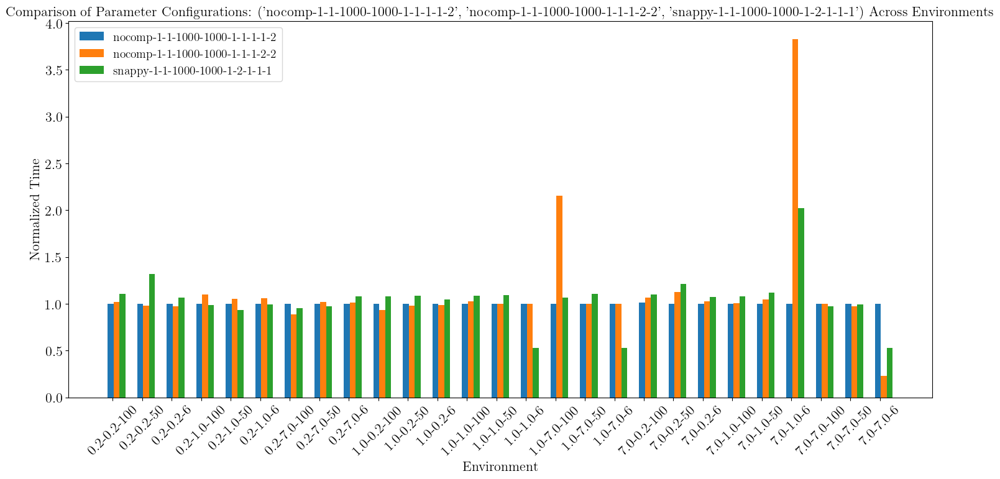

Processing Triplet 2: ('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-1-1-1000-1000-1-2-4-1-1')


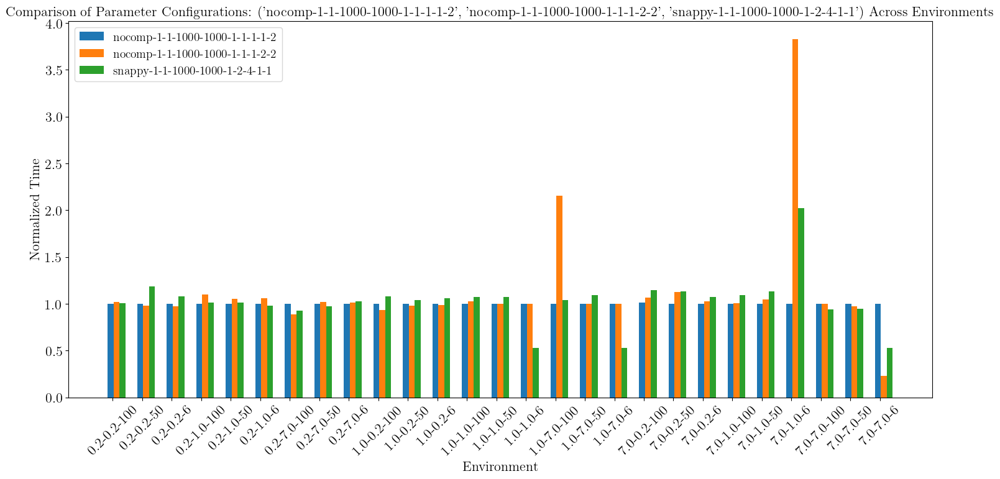

Processing Triplet 3: ('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-1-2-1000-1000-1-1-4-1-1')


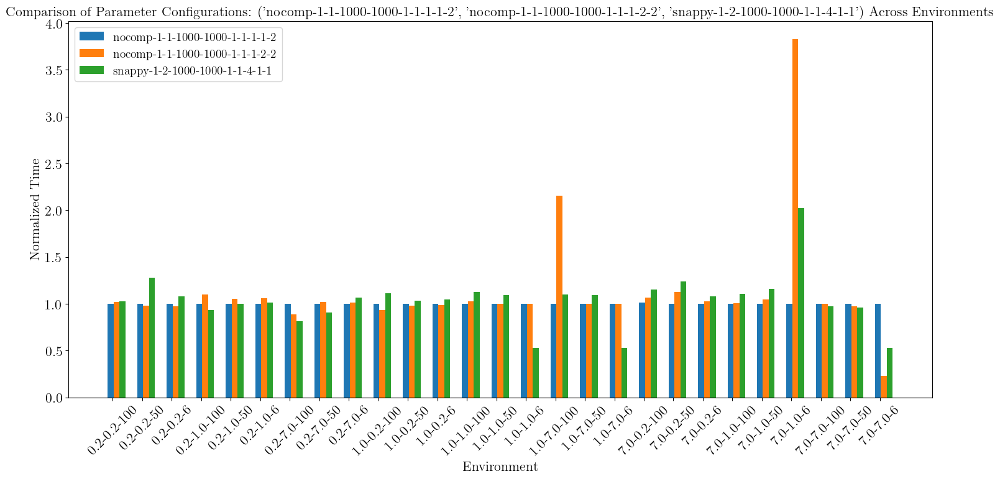

Processing Triplet 4: ('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-2-1-1000-1000-1-2-1-1-1')


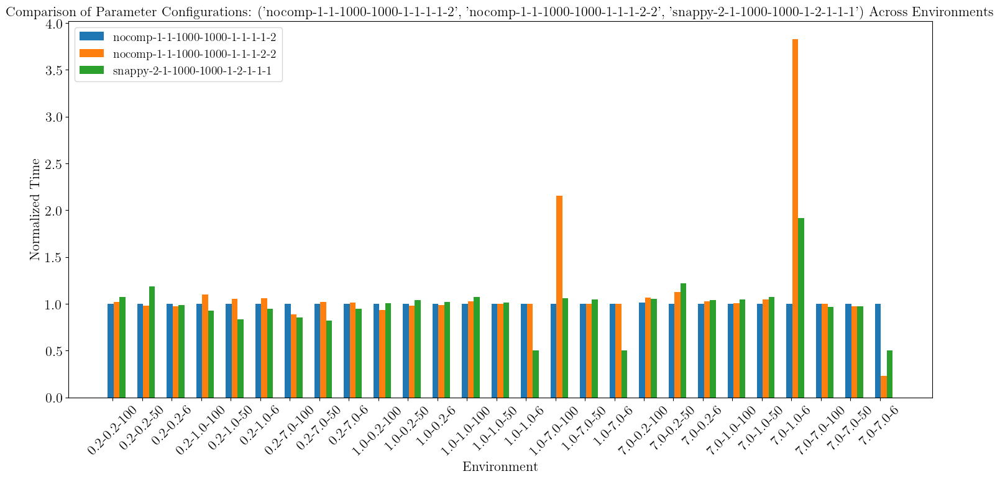

Processing Triplet 5: ('nocomp-1-1-1000-1000-1-1-1-1-2', 'nocomp-1-1-1000-1000-1-1-1-2-2', 'snappy-2-1-1000-1000-1-2-1-4-4')


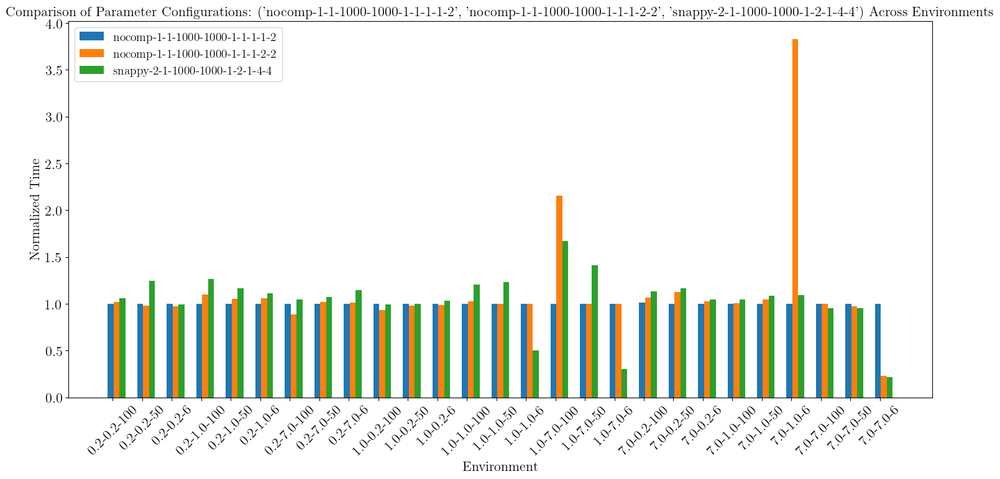

In [101]:

for idx, triplet in enumerate(top_triplets):
    print(f"Processing Triplet {idx + 1}: {triplet}")

    # Prepare DataFrame for the current triplet
    triplet_df = df_copy[df_copy['param_config'].isin(triplet)]

    # Normalize times to the baseline (first config in the triplet)
    baseline_times = triplet_df[triplet_df['param_config'] == triplet[0]].set_index('environment')['time']
    triplet_df = triplet_df.join(baseline_times, on='environment', rsuffix='_baseline')
    triplet_df['normalized_time'] = triplet_df['time'] / triplet_df['time_baseline']

    # Pivot data for grouped bar plot
    pivot_df = triplet_df.pivot_table(index='environment', columns='param_config', values='normalized_time')

    # Plotting
    fig, ax = plt.subplots(figsize=(15, 8))
    bar_width = 0.2  # Width of the bars
    env_index = np.arange(len(pivot_df))  # The label locations

    for i, config in enumerate(triplet):
        ax.bar(env_index + i * bar_width, pivot_df[config], bar_width, label=config)

    ax.set_xlabel('Environment')
    ax.set_ylabel('Normalized Time')
    ax.set_title(f'Comparison of Parameter Configurations: {triplet} Across Environments')
    ax.set_xticks(env_index + bar_width / len(triplet))
    ax.set_xticklabels(pivot_df.index, rotation=45)
    ax.legend()

    plt.tight_layout()
    plt.show()